In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from tqdm import tqdm
import pickle
import utils
import matplotlib as mpl


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/spacepy/time.py:2367: UserWarning: Leapseconds may be out of date. Use spacepy.toolbox.update(leapsecs=True)
  warnings.warn('Leapseconds may be out of date.'


In [ ]:
model_type = 'dbht'
version = 'extended_v0-1_dbht' if model_type == 'dbht' else 'extended_v0-1'

storm_list = pd.read_csv('stormList.csv', header=None, names=['dates'])
storm_list['dates'] = pd.to_datetime(storm_list['dates'])
ace = pd.read_feather('../data/SW/ace_data.feather')
RP = utils.RegionPreprocessing(region='FSC-4', cluster='fennoscandinavian_cluster', features=['dbht', 'MAGNITUDE'],
								median=True, mean=True, std=True, max=True, forecast=30, window=60, classification=True)
region = RP()

results = pd.read_feather(f'../including_ion_temp_maps/outputs/dbht_max/mc_swmag_modeling_region_FSC-4_version_{version}.feather')
print(results.columns)
test_storm_list = storm_list[storm_list['dates'].isin(results['dates'])].reset_index(drop=True, inplace=False)
print(test_storm_list)

omni = pd.read_csv('../data/SW/omni.csv')

ace.set_index('ACEepoch', inplace=True)
ace.index = pd.to_datetime(ace.index)
ace['logT'] = np.log10(ace['T'])

omni.set_index('Epoch', inplace=True)
omni.index = pd.to_datetime(omni.index)
omni = omni[['SYM_H', 'SYM_D', 'AE_INDEX', 'AL_INDEX', 'AU_INDEX', 'BSN_x', 'BSN_y', 'BSN_z', 'ASY_H', 'ASY_D']]
df = pd.concat([ace, omni, region], axis=1)

plotting_storm_dict = utils.storm_extract(df=df, lead=1140, recovery=1140, target_var='classification', map_keys=test_storm_list, target=True)
print(plotting_storm_dict['1995-01-29 23:03:00'].keys())

Forecast: 30, Window: 60, Classification: True Target parameter: rsd
Loading station MAS....
Loading station SOD....
Loading station IVA....
Loading station KEV....
Loading station KIL....
Loading station MUO....
Loading station ABK....
Loading station KIR....
Loading station PEL....
region keys: dict_keys(['stations', 'mlt_station'])
MLT station already defined for region FSC-4
Target parameter: rsd
Index(['predicted_0', 'actual', 'dates', 'predicted_1', 'predicted_2',
       'predicted_3', 'predicted_4', 'predicted_5', 'predicted_6',
       'predicted_7',
       ...
       'predicted_90', 'predicted_91', 'predicted_92', 'predicted_93',
       'predicted_94', 'predicted_95', 'predicted_96', 'predicted_97',
       'predicted_98', 'predicted_99'],
      dtype='object', length=102)
                 dates
0  1998-03-29 19:55:00
1  1998-05-02 15:04:00
2  1998-05-08 15:06:00
3  1998-06-26 04:27:00
4  1998-09-18 13:11:00
5  1998-11-09 17:16:00
6  1999-07-22 07:55:00
7  1999-11-13 20:10:00
8 

In [23]:
features = ['B_Total', 'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz', 'proton_density', 'logT', 'y_true']

def getting_equal_shap_dfs(dates, shap_values, y_true_array, mlt_station, features):
	'''splitting up the individual test storms, adding 60 time steps to the beginning, using this to label
		the datetimes of the shap values and concatenating them together into one dataframe so a mean can
		be taken of each parameter for each time step'''
	storm_list = pd.read_csv('stormList.csv', header=None, names=['dates'])
	storm_list['dates'] = pd.to_datetime(storm_list['dates'], format='%Y-%m-%d %H:%M:%S')

	plotting_dict = {feat: {'list':[]} for feat in features}
	mlt_station.dropna(inplace=True)
	mlt_station = mlt_station.reset_index(inplace=False).rename(columns={'index':'Date_UTC'}, inplace=False)
	mlt_station['Date_UTC'] = pd.to_datetime(mlt_station['Date_UTC'])

	# Taking the extra range of the shap values by using the first date of the shap values and getting the previous 60 non-missing minutes from the mlt_station
	dates = dates.reset_index(drop=False).rename(columns={'index':'reset', 0:'dates'}, inplace=False)
	dates['reseting'] = dates['reset'].diff(-1)

	# breaking the dataframe into individual storms using the reseting column values greater than 60
	storms, shaps, date_ranges, y_true = [], [], [], []
	beginning_int = 0

	for i in range(len(dates)):
		if dates['reseting'].iloc[i] > 360:
			# finding the date in the storm list that's in the segmented dates dataframe
			temp_dates = dates.iloc[beginning_int:i+1]
			try:
				storm_date = storm_list[storm_list['dates'].isin(temp_dates['dates'])]
				storm_date['stime'] = storm_date['dates'] - pd.Timedelta(minutes=1140)
				storm_date['etime'] = storm_date['dates'] + pd.Timedelta(minutes=1140)
				if storm_date.size == 0:
					raise ValueError('Storm date not found in storm list')
			except:
				longer_start = temp_dates['dates'].iloc[0] - pd.Timedelta(minutes=540)
				longer_end = temp_dates['dates'].iloc[-1] + pd.Timedelta(minutes=540)
				storm_date = storm_list[(storm_list['dates'] >= longer_start) & (storm_list['dates'] <= longer_end)]
				storm_date['stime'] = storm_date['dates'] - pd.Timedelta(minutes=1140)
				storm_date['etime'] = storm_date['dates'] + pd.Timedelta(minutes=1140)
				if storm_date.size == 0:
					continue

			d = pd.date_range(start=storm_date['stime'].iloc[0], end=storm_date['etime'].iloc[0], freq='min')
			if (len(d) <= 2281) and (len(temp_dates['dates']) > 60):
				storms.append(temp_dates)
				shaps.append(shap_values[beginning_int:i+1,:,:])
				y_true.append(y_true_array[beginning_int:i+1,1])
				date_ranges.append(d)
				beginning_int = i+1

	# adding the extra 60 minutes to the beginning of each storm
	for storm, shap, storm_full_dates, true in zip(storms, shaps, date_ranges, y_true):
		try:
			loc = mlt_station['Date_UTC'].loc[mlt_station['Date_UTC'] == storm['dates'].iloc[0]].index[0]
		except:
			print(storm['dates'])
			print('MLT STATION')
			print(mlt_station['Date_UTC'])
		extra_range = mlt_station['Date_UTC'].iloc[loc-60:loc].reset_index(inplace=False, drop=True)
		total_date_range = pd.concat([extra_range, storm['dates']], axis=0).reset_index(inplace=False, drop=True)
		total_date_range = pd.to_datetime(total_date_range)
		# date_range = pd.date_range(start=total_date_range.iloc[0], end=total_date_range.iloc[-1], freq='min')
		storm_dict = {feat: pd.DataFrame(index=storm_full_dates) for feat in features}
		for j, (feat, value) in enumerate(storm_dict.items()):
			temp_df = []
			# print(shap[shap.shape[0]-1, :, j])
			if feat == 'y_true':
				for i in range(true.shape[0]):
					temp_df.append(pd.DataFrame(true[i], index=total_date_range[i:i+60], columns=[i]))
			else:
				for i in range(shap.shape[0]):
					temp_df.append(pd.DataFrame(shap[i,:,j], index=total_date_range[i:i+60], columns=[i]))
			temp_df = [storm_dict[feat]] + temp_df
			# print(storm_dict[feat])
			storm_dict[feat] = pd.concat(temp_df, axis=1)
			# storm_dict[feat]['mean'] = storm_dict[feat].mean(axis=1)
			# for df in temp_df:
			# 	storm_dict[feat] = storm_dict[feat].join(df, how='left')
		for feat, value in storm_dict.items():
			if value.shape[0] > 2281:
				continue
			plotting_dict[feat]['list'].append(value.to_numpy())
	for key, value in plotting_dict.items():
		stacked = np.hstack(value['list'])
		plotting_dict[key]['median'] = np.nanmedian(stacked, axis=1)
		plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)
		plotting_dict[key].pop('list')

	return plotting_dict


with open('cluster_dict.pkl', 'rb') as f:
	cluster_dict = pickle.load(f)
for cluster in cluster_dict.values():
	for key, region in cluster['regions'].items():
		print(f'Region: {key}')
		if os.path.exists(f'../including_ion_temp_maps/outputs/shap_values/swmag_region_{key}_{version}.pkl'):
			with open(f'../including_ion_temp_maps/outputs/shap_values/swmag_region_{key}_{version}.pkl', 'rb') as f:
				shap_values = pickle.load(f)
				cluster['regions'][key]['shap'] = {}
				cluster['regions'][key]['shap']['shap'] = np.concatenate([shap_values['shap_values'][i][1][:,:,:,:] for i in range(len(shap_values['shap_values']))], axis=0)
				mlt_station = utils.loading_supermag(cluster['regions'][key]['mlt_station'])
				cluster['regions'][key]['ytest'] = shap_values['ytest']
				cluster['regions'][key]['shap']['shap'] = cluster['regions'][key]['shap']['shap'].reshape(cluster['regions'][key]['shap']['shap'].shape[0], cluster['regions'][key]['shap']['shap'].shape[2], cluster['regions'][key]['shap']['shap'].shape[3])
				if not os.path.exists(f'outputs/{model_type}_{key}_equal_shap_dict.pkl'):
					plotting_dict = getting_equal_shap_dfs(shap_values['Date_UTC'], cluster['regions'][key]['shap']['shap'], cluster['regions'][key]['ytest'], mlt_station, features)
					with open(f'outputs/dbht_{key}_equal_shap_dict.pkl', 'wb') as f:
						pickle.dump(plotting_dict, f)
				else:
					with open(f'outputs/{model_type}_{key}_equal_shap_dict.pkl', 'rb') as f:
						plotting_dict = pickle.load(f)
				
				cluster['regions'][key]['sea_dict'] = plotting_dict

Region: CAN-0
Loading station NEW....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: CAN-1
Loading station LET....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: CAN-2
Loading station MEA....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: GRL-0
Loading station STF....
24340   2002-01-10 11:30:00
24341   2002-01-10 11:31:00
24342   2002-01-10 11:32:00
24343   2002-01-10 11:33:00
24344   2002-01-10 11:34:00
                ...        
26343   2002-01-12 00:26:00
26344   2002-01-12 00:27:00
26345   2002-01-12 00:28:00
26346   2002-01-12 00:29:00
26347   2002-01-12 00:30:00
Name: dates, Length: 2008, dtype: datetime64[ns]
MLT STATION
0          1995-01-01 00:01:00
1          1995-01-01 00:02:00
2          1995-01-01 00:03:00
3          1995-01-01 00:04:00
4          1995-01-01 00:05:00
                   ...        
12584291   2019-12-31 23:55:00
12584292   2019-12-31 23:56:00
12584293   2019-12-31 23:57:00
12584294   2019-12-31 23:58:00
12584295   2019-12-31 23:59:00
Name: Date_UTC, Length: 12584296, dtype: datetime64[ns]


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: GRL-1
Loading station GDH....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: GRL-2
Loading station GDH....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: GRL-3
Loading station NAQ....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: FSC-0
Loading station LYC....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: FSC-1
Loading station NUR....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: FSC-2
Loading station ABK....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: FSC-3
Loading station ABK....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: FSC-4
Loading station ABK....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: FSC-5
Loading station ABK....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: FSC-6
Loading station ABK....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: CEU-0
Loading station BEL....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: CEU-1
Loading station BEL....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: CEU-2
Loading station HRB....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: CEU-3
Loading station WNG....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: SVLB
Loading station HRN....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: JPN-0
Loading station KNY....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: JPN-1
Loading station MMB....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: ALSK
Loading station CMO....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: HUD-0
Loading station PIN....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


Region: HUD-1
Loading station BLC....


/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/tmp/ipykernel_3485629/875862619.py:85: RuntimeWarning: Mean of empty slice
  plotting_dict[key]['mean'] = np.nanmean(stacked, axis=1)


In [10]:
for cluster in cluster_dict.values():
	for key, region in cluster['regions'].items():
		region['mlat'] = utils.getting_mean_lat(region['stations'])

Loading station NEW....
Loading station T19....
Loading station C10....
Loading station LET....
Loading station T03....
Loading station T43....
Loading station LET....
Loading station T03....
Loading station T43....
Loading station RED....
Loading station C06....
Loading station T43....
Loading station RED....
Loading station C06....
Loading station MEA....
Loading station T36....
Loading station GHB....
Loading station SKT....
Loading station STF....
Loading station ATU....
Loading station SKT....
Loading station STF....
Loading station ATU....
Loading station GDH....
Loading station STF....
Loading station ATU....
Loading station GDH....
Loading station UMQ....
Loading station GHB....
Loading station FHB....
Loading station NAQ....
Loading station RVK....
Loading station LYC....
Loading station DON....
Loading station JCK....
Loading station HAN....
Loading station MEK....
Loading station OUJ....
Loading station NUR....
Loading station MAS....
Loading station NOR....
Loading station 

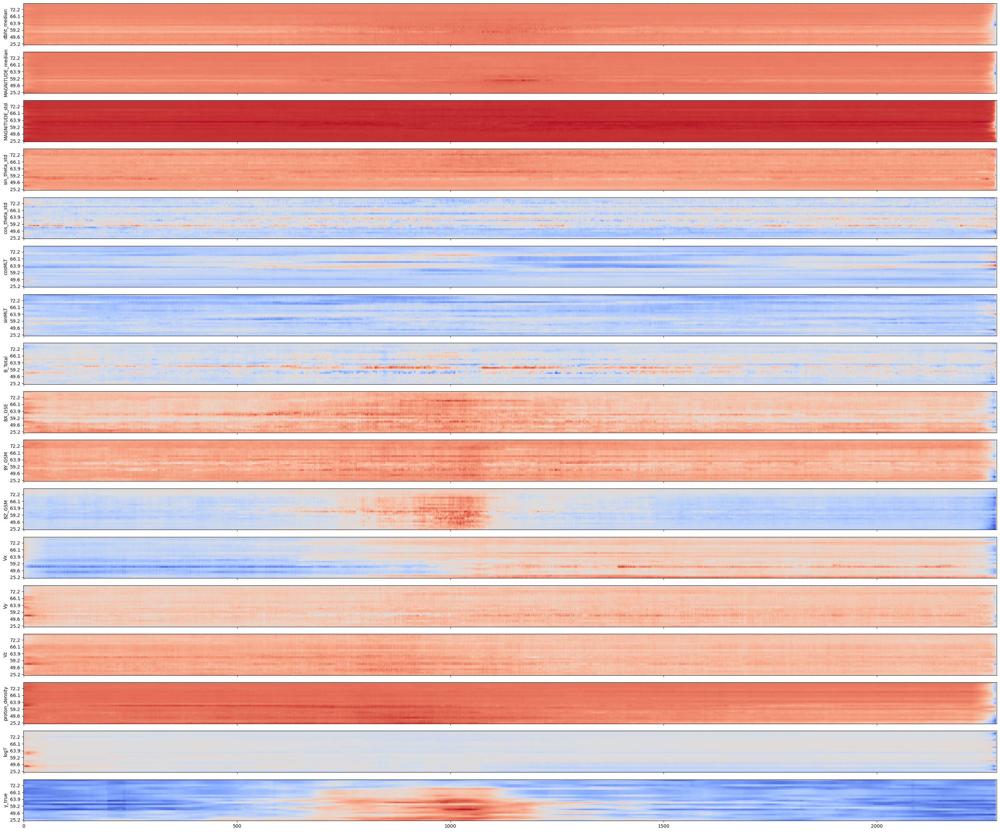

In [ ]:
stat = 'median'

fig, ax = plt.subplots(len(region['sea_dict'][stat].keys()), 1, figsize=(30,25), sharex=True)
plot_map_dict = {feat: {'shap':[], 'mlat':[]} for feat in features}
for cluster in cluster_dict.values():
	for key, region in cluster['regions'].items():
		for i, (feat, value) in enumerate(region['sea_dict'][stat].items()):
			plot_map_dict[feat]['shap'].append(value)
			plot_map_dict[feat]['mlat'].append(region['mlat'])

# sorting the values by the mlat
for key, value in plot_map_dict.items():
	plot_map_dict[key]['shap'] = [x for _, x in sorted(zip(value['mlat'], value['shap']))]
	plot_map_dict[key]['mlat'] = [x for x, _ in sorted(zip(value['mlat'], value['shap']))]

for i, (feat, value) in enumerate(plot_map_dict.items()):
	ax[i].imshow(np.vstack(value['shap']), aspect='auto', cmap='coolwarm', origin='lower')
	ax[i].set_yticks([x for x in range(0, len(value['mlat']), 4)])
	ax[i].set_yticklabels([value['mlat'][x].round(1) for x in range(0, len(value['mlat']), 4)])
	ax[i].set_ylabel(feat)
plt.tight_layout()
plt.show()
		# plt.show()
		# break
	# break


/tmp/ipykernel_3485629/1385520729.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  plotting_dfs[var]['median'] = plotting_dfs[var].median(axis=1)
/tmp/ipykernel_3485629/1385520729.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  plotting_dfs[var]['median'] = plotting_dfs[var].median(axis=1)
/tmp/ipykernel_3485629/1385520729.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.

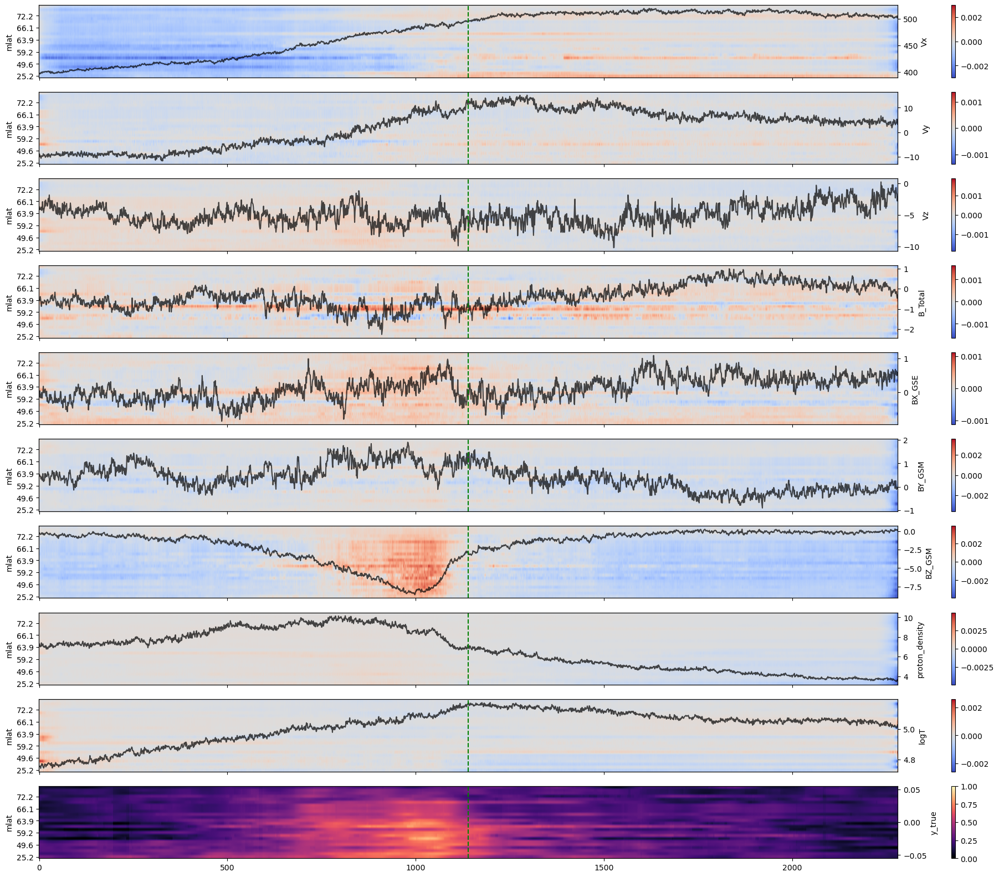

In [25]:
to_plot = ['Vx', 'Vy', 'Vz', 'B_Total', 'BX_GSE', 'BY_GSM', 'BZ_GSM', 'proton_density', 'logT', 'y_true', 'SYM_H']

plotting_dfs = {key: pd.DataFrame() for key in to_plot}
top_var, bottom_var = 'classification', 'SYM_H'
for key, value in plotting_storm_dict.items():
	if isinstance(value['storm'].index, pd.DatetimeIndex):
		value['storm'].reset_index(inplace=True, drop=False)
	
	for var in to_plot:
		if var =='y_true':
			continue
		if var not in value['storm'].columns:
			plotting_dfs[var] = pd.concat([plotting_dfs[var], pd.Series(value['target'])], axis=1)
		plotting_dfs[var] = pd.concat([plotting_dfs[var], value['storm'][var]], axis=1)

	# if top_var not in value['storm'].columns:
	# 	top_df = pd.concat([top_df, pd.Series(value['target'])], axis=1)
	# bottom_df = pd.concat([bottom_df, value['storm'][bottom_var]], axis=1)

for var in to_plot:
	plotting_dfs[var]['median'] = plotting_dfs[var].median(axis=1)

# top_df['mean'] = top_df.mean(axis=1)
# bottom_df['mean'] = bottom_df.mean(axis=1)
# print(top_df)
plotting_rows = len(to_plot) if 'SYM_H' not in to_plot else len(to_plot) - 1
fig, axes = plt.subplots(plotting_rows, 1, figsize=(25, 20), sharex=True)
for i, var in enumerate(to_plot):
	if var == 'SYM_H':
		continue
	try:
		scale = max(abs(np.nanmin(plot_map_dict[var]['shap'])), abs(np.nanmax(plot_map_dict[var]['shap'])))
		if var == 'y_true':
			plotting_norm = mpl.colors.Normalize(vmin=0, vmax=1)
			color_map = 'magma'
		else:
			plotting_norm = mpl.colors.Normalize(vmin=-scale, vmax=scale)
			color_map = 'coolwarm'
		cbar = fig.colorbar(axes[i].imshow(np.vstack(plot_map_dict[var]['shap']), aspect='auto', cmap=color_map, origin='lower', norm=plotting_norm), ax=axes[i])
		axes[i].set_yticks([x for x in range(0, len(plot_map_dict[var]['mlat']), 4)])
		axes[i].set_yticklabels([plot_map_dict[var]['mlat'][x].round(1) for x in range(0, len(plot_map_dict[var]['mlat']), 4)])
		axes[i].set_ylabel('mlat')
		ax = axes[i].twinx()
		ax.plot(plotting_dfs[var]['median'], color='black', alpha=0.7)
		ax.axvline(x=plotting_dfs['SYM_H']['median'].idxmin(), color='green', linestyle='--')
		ax.set_ylabel(var)
		ax.margins(x=0)
	except KeyError:
		axes[i].plot(plotting_dfs[var]['median'], color='black')
		# placing a verticle line at the minimum value of sym h
		axes[i].axvline(x=plotting_dfs['SYM_H']['median'].idxmin(), color='green', linestyle='--')
		if var == 'y_true':
			axes[i].set_ylabel('y true %')
		else:
			axes[i].set_ylabel(var)

		axes[i].margins(x=0)

# axes.plot(top_df['mean'], color='blue')
# axes.set_ylabel(top_var, fontsize=15, color='blue')
# axes.tick_params(axis='y', labelcolor='blue')
# ax2 = axes.twinx()
# ax2.plot(bottom_df['mean'], color='red')
# ax2.set_ylabel(bottom_var, fontsize=15, color='red')
# ax2.tick_params(axis='y', labelcolor='red')

# plt.title(f'Mean of {top_var} and {bottom_var} for all storms', fontsize=20)

plt.savefig(f'sea_{model_type}_median_median_vars.png')

                   index  B_Total  BX_GSE  BY_GSM  BZ_GSM  Vx  Vy  Vz  \
0    1995-01-28 22:03:00      NaN     NaN     NaN     NaN NaN NaN NaN   
1    1995-01-28 22:04:00      NaN     NaN     NaN     NaN NaN NaN NaN   
2    1995-01-28 22:05:00      NaN     NaN     NaN     NaN NaN NaN NaN   
3    1995-01-28 22:06:00      NaN     NaN     NaN     NaN NaN NaN NaN   
4    1995-01-28 22:07:00      NaN     NaN     NaN     NaN NaN NaN NaN   
...                  ...      ...     ...     ...     ...  ..  ..  ..   
2636 1995-01-30 17:59:00      NaN     NaN     NaN     NaN NaN NaN NaN   
2637 1995-01-30 18:00:00      NaN     NaN     NaN     NaN NaN NaN NaN   
2638 1995-01-30 18:01:00      NaN     NaN     NaN     NaN NaN NaN NaN   
2639 1995-01-30 18:02:00      NaN     NaN     NaN     NaN NaN NaN NaN   
2640 1995-01-30 18:03:00      NaN     NaN     NaN     NaN NaN NaN NaN   

      proton_density   T  ...  dbht_std  dbht_median  MAGNITUDE_mean  \
0                NaN NaN  ...       NaN          Na

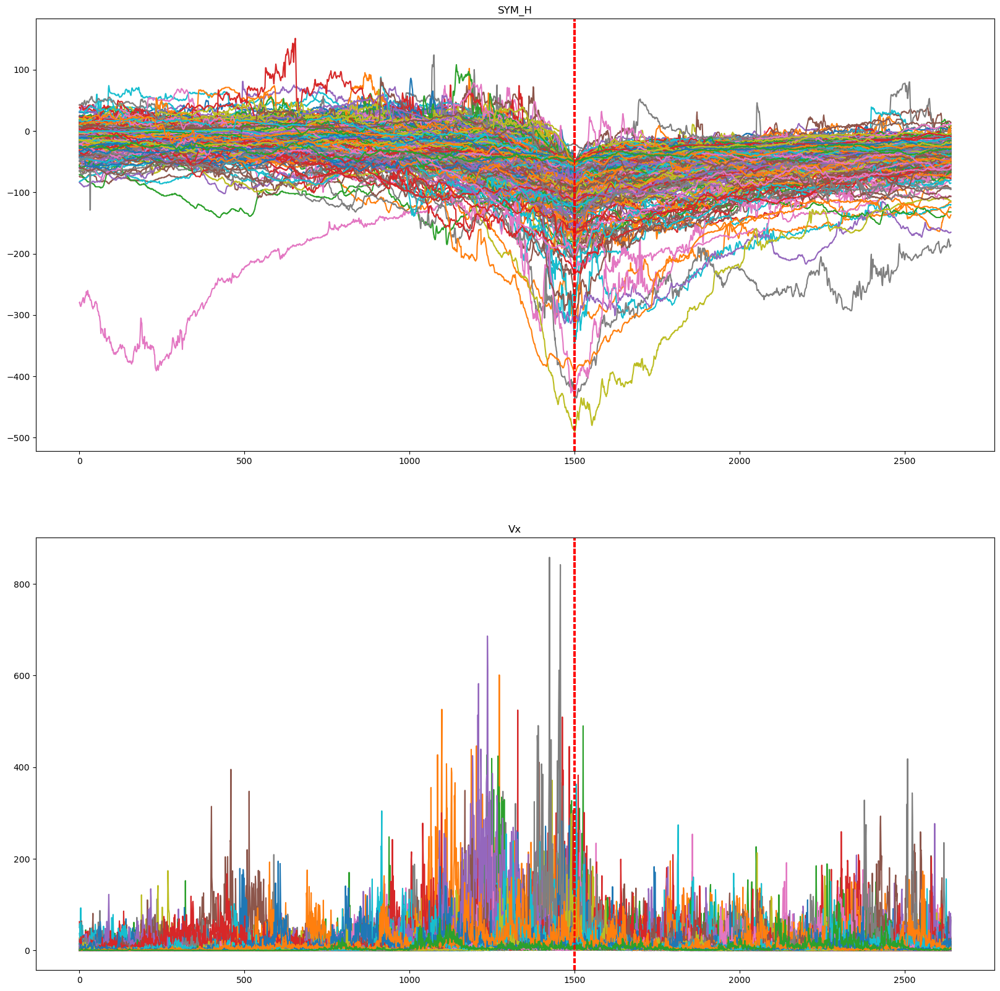

In [5]:
fig, axes = plt.subplots(2, 1, figsize=(20, 20))
for i, ((key,value), date) in enumerate(zip(storms_dict.items(), storm_list['dates'])):
	if isinstance(value['storm'].index, pd.DatetimeIndex):
		value['storm'].reset_index(drop=False, inplace=True)
	print(value['storm'])
	axes[0].plot(value['storm']['SYM_H'])
	# finding the iloc of the date

	axes[0].axvline(value['storm'][value['storm']['index'] == date].index, color='red', linestyle='--')

	axes[1].plot(value['storm']['rsd'], label=key)
	axes[1].axvline(value['storm'][value['storm']['index'] == date].index, color='red', linestyle='--')

axes[0].set_title('SYM_H')
axes[1].set_title('Vx')
plt.show()